<a href="https://colab.research.google.com/github/imartinez96/FIFA_Prediction/blob/master/FIFA19_PredictPotential.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Predict Overall Score of FIFA Player

## Introduction
Football has a huge fanbase all over the world. Every year, after the end of season, the transfer window allows different clubs to buy, sell or loan players to/from other clubs. Also, the betting agencies start placing their bets on whether a player will complete his rumored transfer to the club in picture. Before spending millions on a player, the clubs analyze the player’s past performance and his future potential to make sure if he will be worth the hassle or not. EA Sports’ FIFA 19 is the latest version of their football simulation game. FIFA provides ratings of the players based on the performance in the past season, and his potential based on attributes like passing accuracy, dribbling, crossing, finishing, height, weight, etc. Different clubs would certainly want to predict the potential of the player before finalizing a deal to get him to their club.  

In [1]:
import numpy as np 
import pandas as pd 

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor

from sklearn.model_selection import GridSearchCV

from sklearn import metrics
from sklearn.metrics import r2_score

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

## Data Cleaning

The dataset contains complete details of the players attributes such as age, preferred foot, weak foot, wages, skill moves, crossing, finishing, stamina, header accuracy, shot accuracy, etc. Some of the attributes such as stamina, strength, acceleration have a few null entries. These null entries have been replaced by the mean of the attribute to remove any discrepancy.  

 

In [2]:
#load data
df_soccer = pd.read_csv("data.csv")

In [3]:
df_soccer.head()

,Unnamed: 0,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,Value,Wage,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Real Face,Position,Jersey Number,Joined,Loaned From,Contract Valid Until,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,...,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,0,158023,L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,https://cdn.sofifa.org/teams/2/light/241.png,€110.5M,€565K,2202,Left,5.0,4.0,4.0,Medium/ Medium,Messi,Yes,RF,10.0,"Jul 1, 2004",NaN,2021,5'7,159lbs,88+2,88+2,88+2,92+2,93+2,93+2,93+2,92+2,93+2,93+2,93+2,91+2,...,59+2,47+2,47+2,47+2,59+2,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M
1,1,20801,Cristiano Ronaldo,33,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Juventus,https://cdn.sofifa.org/teams/2/light/45.png,€77M,€405K,2228,Right,5.0,4.0,5.0,High/ Low,C. Ronaldo,Yes,ST,7.0,"Jul 10, 2018",NaN,2022,6'2,183lbs,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,...,61+3,53+3,53+3,53+3,61+3,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M
2,2,190871,Neymar Jr,26,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,93,Paris Saint-Germain,https://cdn.sofifa.org/teams/2/light/73.png,€118.5M,€290K,2143,Right,5.0,5.0,5.0,High/ Medium,Neymar,Yes,LW,10.0,"Aug 3, 2017",NaN,2022,5'9,150lbs,84+3,84+3,84+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,88+3,...,60+3,47+3,47+3,47+3,60+3,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M
3,3,193080,De Gea,27,https://cdn.sofifa.org/players/4/19/193080.png,Spain,https://cdn.sofifa.org/flags/45.png,91,93,Manchester United,https://cdn.sofifa.org/teams/2/light/11.png,€72M,€260K,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,Yes,GK,1.0,"Jul 1, 2011",NaN,2020,6'4,168lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M
4,4,192985,K. De Bruyne,27,https://cdn.sofifa.org/players/4/19/192985.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,92,Manchester City,https://cdn.sofifa.org/teams/2/light/10.png,€102M,€355K,2281,Right,4.0,5.0,4.0,High/ High,Normal,Yes,RCM,7.0,"Aug 30, 2015",NaN,2023,5'11,154lbs,82+3,82+3,82+3,87+3,87+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,...,73+3,66+3,66+3,66+3,73+3,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M


In [4]:
df_soccer.shape

(18207, 89)

In [5]:
df_soccer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18207 entries, 0 to 18206
Data columns (total 89 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                18207 non-null  int64  
 1   ID                        18207 non-null  int64  
 2   Name                      18207 non-null  object 
 3   Age                       18207 non-null  int64  
 4   Photo                     18207 non-null  object 
 5   Nationality               18207 non-null  object 
 6   Flag                      18207 non-null  object 
 7   Overall                   18207 non-null  int64  
 8   Potential                 18207 non-null  int64  
 9   Club                      17966 non-null  object 
 10  Club Logo                 18207 non-null  object 
 11  Value                     18207 non-null  object 
 12  Wage                      18207 non-null  object 
 13  Special                   18207 non-null  int64  
 14  Prefer

In [6]:
df_soccer.describe()

,Unnamed: 0,ID,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Jersey Number,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes
count,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18159.000000,18159.000000,18159.000000,18147.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000
mean,9103.000000,214298.338606,25.122206,66.238699,71.307299,1597.809908,1.113222,2.947299,2.361308,19.546096,49.734181,45.550911,52.298144,58.686712,42.909026,55.371001,47.170824,42.863153,52.711933,58.369459,64.614076,64.726967,63.503607,61.836610,63.966573,55.460047,65.089432,63.219946,65.311967,47.109973,55.868991,46.698276,49.958478,53.400903,48.548598,58.648274,47.281623,47.697836,45.661435,16.616223,16.391596,16.232061,16.388898,16.710887
std,5256.052511,29965.244204,4.669943,6.908930,6.136496,272.586016,0.394031,0.660456,0.756164,15.947765,18.364524,19.525820,17.379909,14.699495,17.694408,18.910371,18.395264,17.478763,15.327870,16.686595,14.927780,14.649953,14.766049,9.010464,14.136166,17.237958,11.820044,15.894741,12.557000,19.260524,17.367967,20.696909,19.529036,14.146881,15.704053,11.436133,19.904397,21.664004,21.289135,17.695349,16.906900,16.502864,17.034669,17.955119
min,0.000000,16.000000,16.000000,46.000000,48.000000,731.000000,1.000000,1.000000,1.000000,1.000000,5.000000,2.000000,4.000000,7.000000,4.000000,4.000000,6.000000,3.000000,9.000000,5.000000,12.000000,12.000000,14.000000,21.000000,16.000000,2.000000,15.000000,12.000000,17.000000,3.000000,11.000000,3.000000,2.000000,10.000000,5.000000,3.000000,3.000000,2.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,4551.500000,200315.500000,21.000000,62.000000,67.000000,1457.000000,1.000000,3.000000,2.000000,8.000000,38.000000,30.000000,44.000000,54.000000,30.000000,49.000000,34.000000,31.000000,43.000000,54.000000,57.000000,57.000000,55.000000,56.000000,56.000000,45.000000,58.000000,56.000000,58.000000,33.000000,44.000000,26.000000,38.000000,44.000000,39.000000,51.000000,30.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,9103.000000,221759.000000,25.000000,66.000000,71.000000,1635.000000,1.000000,3.000000,2.000000,17.000000,54.000000,49.000000,56.000000,62.000000,44.000000,61.000000,48.000000,41.000000,56.000000,63.000000,67.000000,67.000000,66.000000,62.000000,66.000000,59.000000,66.000000,66.000000,67.000000,51.000000,59.000000,52.000000,55.000000,55.000000,49.000000,60.000000,53.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,13654.500000,236529.500000,28.000000,71.000000,75.000000,1787.000000,1.000000,3.000000,3.000000,26.000000,64.000000,62.000000,64.000000,68.000000,57.000000,68.000000,62.000000,57.000000,64.000000,69.000000,75.000000,75.000000,74.000000,68.000000,74.000000,68.000000,73.000000,74.000000,74.000000,62.000000,69.000000,64.000000,64.000000,64.000000,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,18206.000000,246620.000000,45.000000,94.000000,95.000000,2346.000000,5.000000,5.000000,5.000000,99.000000,93.000000,95.000000,94.000000,93.000000,90.000000,97.000000,94.000000,94.000000,93.000000,96.000000,97.000000,96.000000,96.000000,96.000000,96.000000,95.000000,95.000000,96.000000,97.000000,94.000

In [7]:
df_soccer.dtypes

Unnamed: 0          int64
ID                  int64
Name               object
Age                 int64
Photo              object
                   ...   
GKHandling        float64
GKKicking         float64
GKPositioning     float64
GKReflexes        float64
Release Clause     object
Length: 89, dtype: object

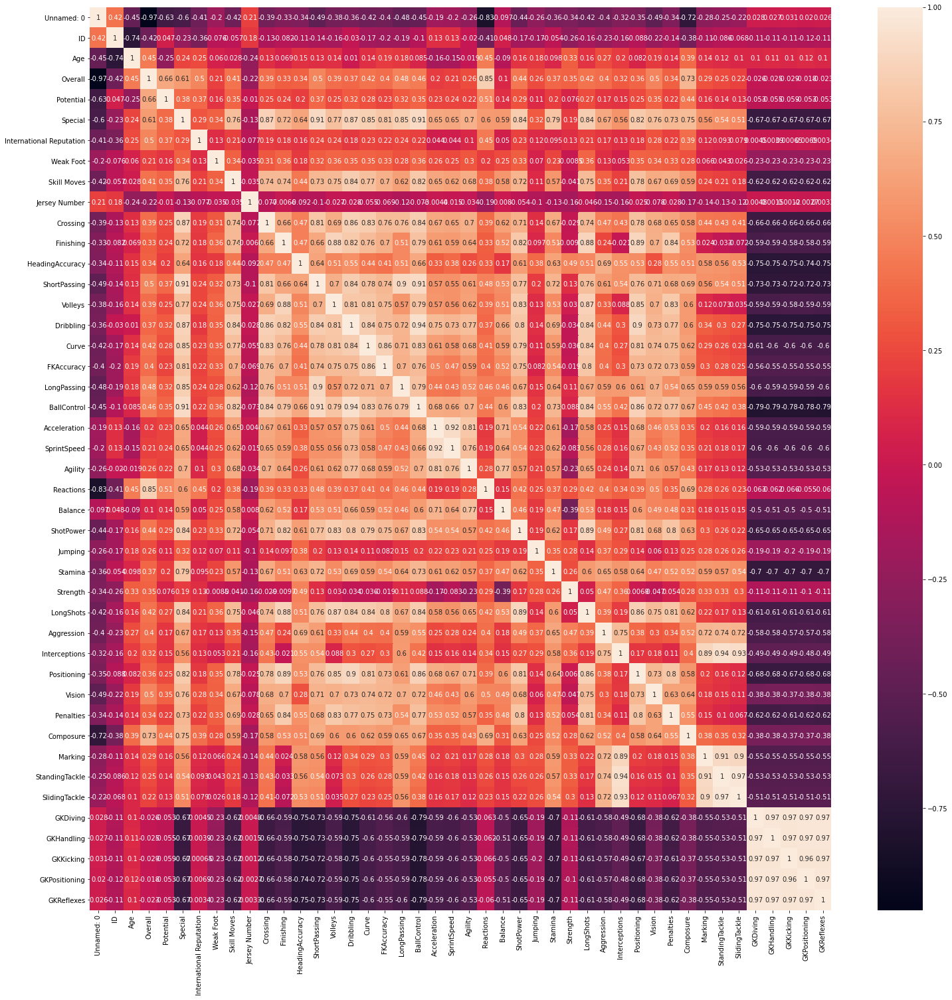

In [8]:
plt.subplots(figsize=(25,25))
sns.heatmap(df_soccer.corr(), annot=True);

## Let's clean the data 

The dataset contains complete details of the players attributes such as age, preferred foot, weak foot, wages, skill moves, crossing, finishing, stamina, header accuracy, shot accuracy, etc. Some of the attributes such as stamina, strength, acceleration have a few null entries. These null entries have been replaced by the mean of the attribute to remove any discrepancy.  

In [9]:
#Lets take important stats taken from heatmap
df = df_soccer[['ID','Name','Age','Potential','International Reputation', 'Stamina','Strength','Aggression',
                'Composure','BallControl', 'Dribbling','Acceleration','Agility','Vision', 'LongPassing', 'Skill Moves', 'ShortPassing', 'ShotPower',
                'Reactions']]

In [10]:
df.head()

,ID,Name,Age,Potential,International Reputation,Stamina,Strength,Aggression,Composure,BallControl,Dribbling,Acceleration,Agility,Vision,LongPassing,Skill Moves,ShortPassing,ShotPower,Reactions
0,158023,L. Messi,31,94,5.0,72.0,59.0,48.0,96.0,96.0,97.0,91.0,91.0,94.0,87.0,4.0,90.0,85.0,95.0
1,20801,Cristiano Ronaldo,33,94,5.0,88.0,79.0,63.0,95.0,94.0,88.0,89.0,87.0,82.0,77.0,5.0,81.0,95.0,96.0
2,190871,Neymar Jr,26,93,5.0,81.0,49.0,56.0,94.0,95.0,96.0,94.0,96.0,87.0,78.0,5.0,84.0,80.0,94.0
3,193080,De Gea,27,93,4.0,43.0,64.0,38.0,68.0,42.0,18.0,57.0,60.0,68.0,51.0,1.0,50.0,31.0,90.0
4,192985,K. De Bruyne,27,92,4.0,90.0,75.0,76.0,88.0,91.0,86.0,78.0,79.0,94.0,91.0,4.0,92.0,91.0,91.0


In [11]:
df.shape

(18207, 19)

In [12]:
df.isnull().any()

ID                          False
Name                        False
Age                         False
Potential                   False
International Reputation     True
Stamina                      True
Strength                     True
Aggression                   True
Composure                    True
BallControl                  True
Dribbling                    True
Acceleration                 True
Agility                      True
Vision                       True
LongPassing                  True
Skill Moves                  True
ShortPassing                 True
ShotPower                    True
Reactions                    True
dtype: bool

In [13]:
#create a function to clean the dataframe
def clean_df (df):
    
    copy = df
    
    mint = copy['International Reputation'].mean()
    copy['International Reputation'].loc[copy['International Reputation'].isnull()] = mint
    
    mst = copy['Stamina'].mean()
    copy['Stamina'].loc[copy['Stamina'].isnull()] = mst
    
    mstr = copy['Strength'].mean()
    copy['Strength'].loc[copy['Strength'].isnull()] = mstr
    
    mcomp = copy['Composure'].mean()
    copy['Composure'].loc[copy['Composure'].isnull()] = mcomp

    magr = copy['Aggression'].mean()
    copy['Aggression'].loc[copy['Aggression'].isnull()] = magr

    mball = copy['BallControl'].mean()
    copy['BallControl'].loc[copy['BallControl'].isnull()] = mball

    mdrib = copy['Dribbling'].mean()
    copy['Dribbling'].loc[copy['Dribbling'].isnull()] = mdrib

    macc = copy['Acceleration'].mean()
    copy['Acceleration'].loc[copy['Acceleration'].isnull()] = macc

    magi = copy['Agility'].mean()
    copy['Agility'].loc[copy['Agility'].isnull()] = magi

    mvis = copy['Vision'].mean()
    copy['Vision'].loc[copy['Vision'].isnull()] = mvis

    mlp = copy['LongPassing'].mean()
    copy['LongPassing'].loc[copy['LongPassing'].isnull()] = mlp

    msm = copy['Skill Moves'].mean()
    copy['Skill Moves'].loc[copy['Skill Moves'].isnull()] = msm

    msp = copy['ShortPassing'].mean()
    copy['ShortPassing'].loc[copy['ShortPassing'].isnull()] = msp

    mspw = copy['ShotPower'].mean()
    copy['ShotPower'].loc[copy['ShotPower'].isnull()] = mspw

    mrea = copy['Reactions'].mean()
    copy['Reactions'].loc[copy['Reactions'].isnull()] = mrea    
    
    return copy

In [14]:
clean_df(df)
df.isnull().any()

ID                          False
Name                        False
Age                         False
Potential                   False
International Reputation    False
Stamina                     False
Strength                    False
Aggression                  False
Composure                   False
BallControl                 False
Dribbling                   False
Acceleration                False
Agility                     False
Vision                      False
LongPassing                 False
Skill Moves                 False
ShortPassing                False
ShotPower                   False
Reactions                   False
dtype: bool

## Feature Selection  

A few attributes such as body type, face, flag, etc. have been removed as they will not be used to predict the potential of the player.  

The following features have been chosen to predict the potential based on correlation heatmap: 
1. Age  

2. International Reputation  

3. Stamina 
4. Strength 
5. Aggression 

6. Composure  

7. Ball Control 

8. Dribbling 
9. Acceleration 
10. Vision
11.  Agility
12. Long Passing
13. Skill Moves
14. Short Passing
15. Shot Power
16. Reactions

In [15]:
df.describe()

,ID,Age,Potential,International Reputation,Stamina,Strength,Aggression,Composure,BallControl,Dribbling,Acceleration,Agility,Vision,LongPassing,Skill Moves,ShortPassing,ShotPower,Reactions
count,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000
mean,214298.338606,25.122206,71.307299,1.113222,63.219946,65.311967,55.868991,58.648274,58.369459,55.371001,64.614076,63.503607,53.400903,52.711933,2.361308,58.686712,55.460047,61.836610
std,29965.244204,4.669943,6.136496,0.393511,15.873774,12.540436,17.345057,11.421047,16.664584,18.885426,14.908088,14.746571,14.128219,15.307651,0.755167,14.680105,17.215219,8.998579
min,16.000000,16.000000,48.000000,1.000000,12.000000,17.000000,11.000000,3.000000,5.000000,4.000000,12.000000,14.000000,10.000000,9.000000,1.000000,7.000000,2.000000,21.000000
25%,200315.500000,21.000000,67.000000,1.000000,56.000000,58.000000,44.000000,51.000000,54.000000,49.000000,57.000000,55.000000,44.000000,43.000000,2.000000,54.000000,45.000000,56.000000
50%,221759.000000,25.000000,71.000000,1.000000,66.000000,66.000000,59.000000,59.000000,63.000000,61.000000,67.000000,66.000000,55.000000,56.000000,2.000000,62.000000,59.000000,62.000000
75%,236529.500000,28.000000,75.000000,1.000000,74.000000,74.000000,69.000000,67.000000,69.000000,68.000000,75.000000,74.000000,64.000000,64.000000,3.000000,68.000000,68.000000,68.000000
max,246620.000000,45.000000,95.000000,5.000000,96.000000,97.000000,95.000000,96.000000,96.000000,97.000000,97.000000,96.000000,94.000000,93.000000,5.000000,93.000000,95.000000,96.000000


<Figure size 1440x1440 with 0 Axes>

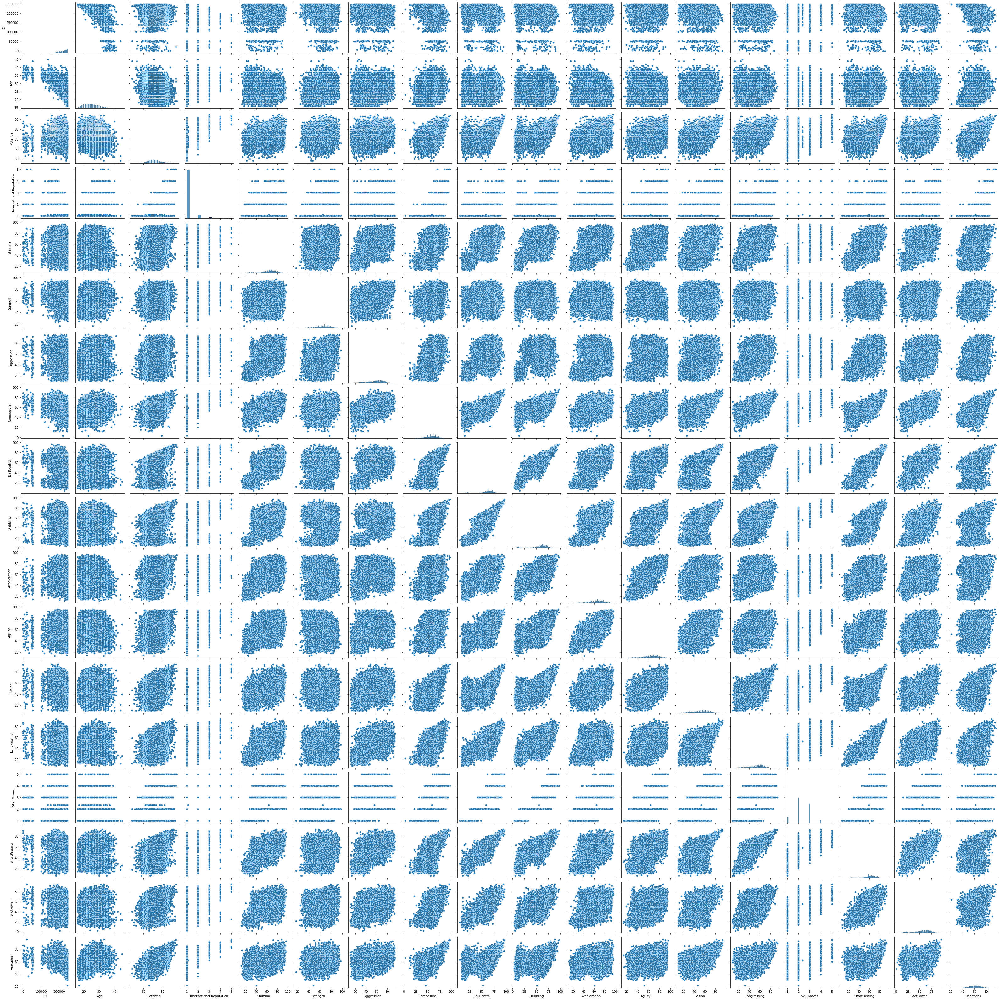

In [16]:
#pairplat to visualize relationship between data
plt.figure(figsize=(20,20))
sns.pairplot(df)

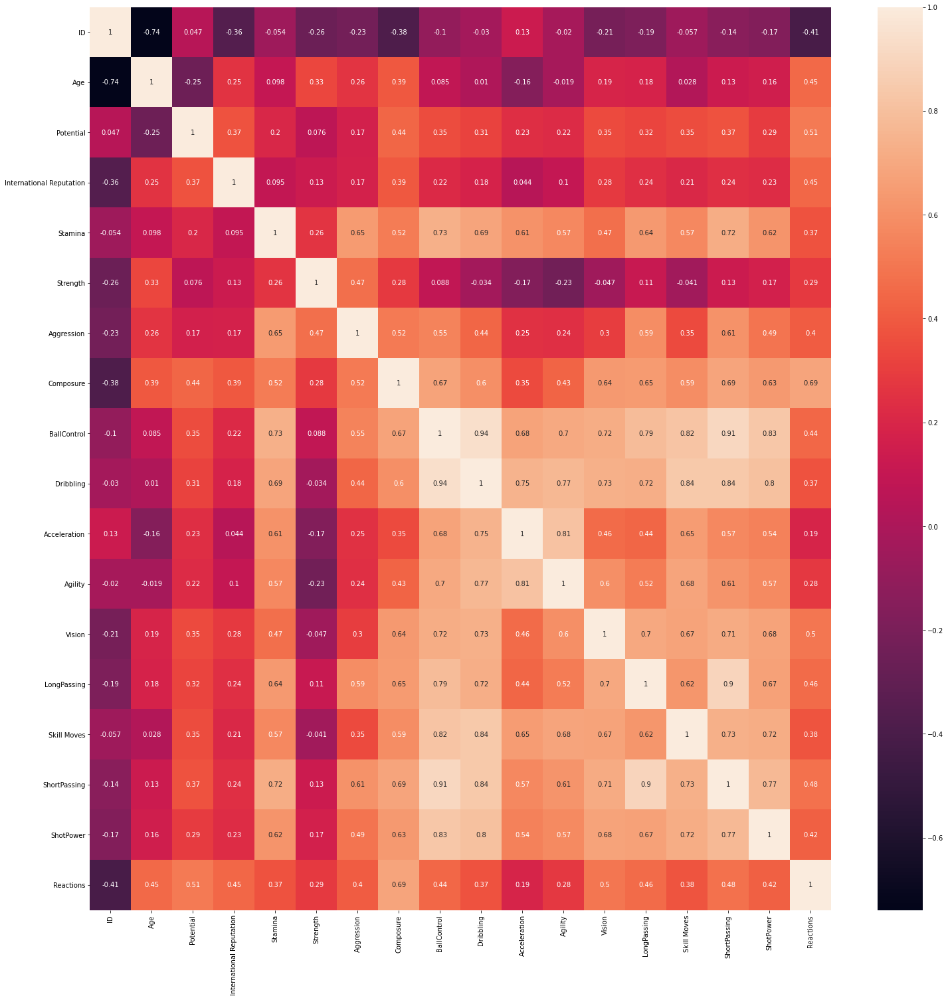

In [17]:
#Lets take a look at the heatmap again with our chosen features
plt.subplots(figsize=(25,25))
sns.heatmap(df.corr(), annot=True);

# Exploratory Data Analysis

Let's now compare the potential of a player with other attributes present in the dataset. 

## Target Variable  

The potential of a player has been chosen as the target variable. The potential of a player represents how a player would perform keeping in view that the player remains injury free for most the duration of the season.  

### Potential & Stamina
The following scatter plot shows the relationship between the target variable ‘Potential’ and ‘Stamina’ attribute. ‘ 

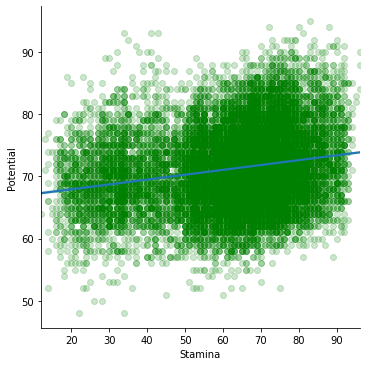

In [18]:
sns.lmplot(data=df, x='Stamina', y='Potential', scatter_kws={'alpha':0.2, 'color':'g'})

### Potential & Age
The following scatter plot shows the relationship between the target variable ‘Potential’ and ‘Age’ attribute. The older a player gets, the less potential they have. This logically makes sense.

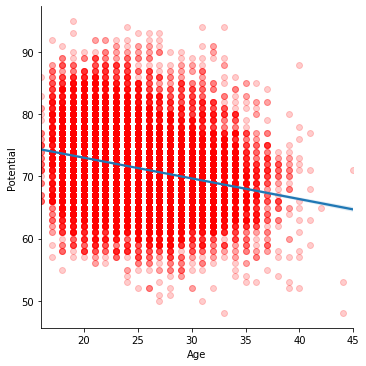

In [19]:
sns.lmplot(data=df, x='Age', y='Potential', scatter_kws={'alpha':0.2, 'color':'r'})

### Potential & International Reputation

The following scatter plot shows the relationship between the target variable ‘Potential’ and ‘International Reputation’ attribute. 

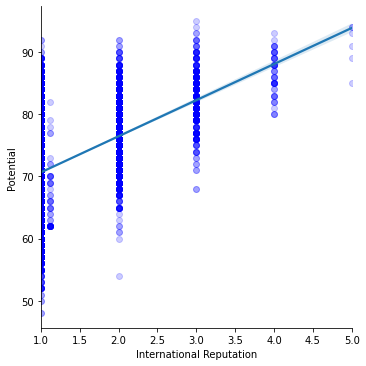

In [20]:
sns.lmplot(data = df, x ='International Reputation', y = 'Potential', scatter_kws={'alpha':0.2, 'color':'b'})

### Potential & Strength

The following scatter plot shows the relationship between the target variable ‘Potential’ and ‘Strength’ attribute.

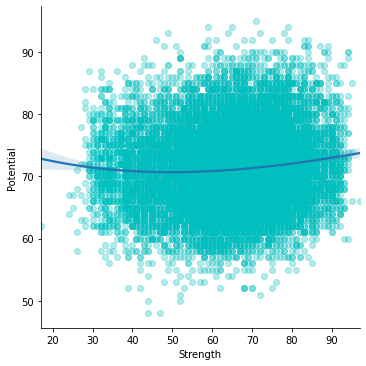

In [21]:
sns.lmplot(data = df, x='Strength', y='Potential',order=3, scatter_kws={'alpha':0.3, 'color':'c'})

### Potential & Dribbling

The following scatter plot shows the relationship between the target variable ‘Potential’ and ‘Dribbling’ attribute.

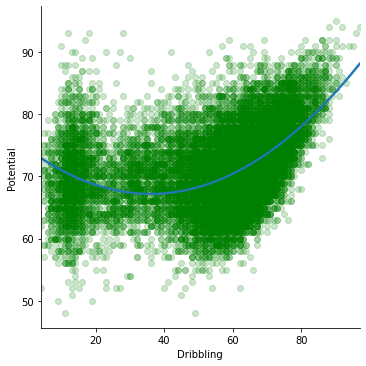

In [22]:
sns.lmplot(data = df, x='Dribbling', y='Potential',order=2, scatter_kws={'alpha':0.2, 'color':'g'})

### Potential & Acceleration
The following scatter plot shows the relationship between the target variable ‘Potential’ and ‘Acceleration’ attribute.

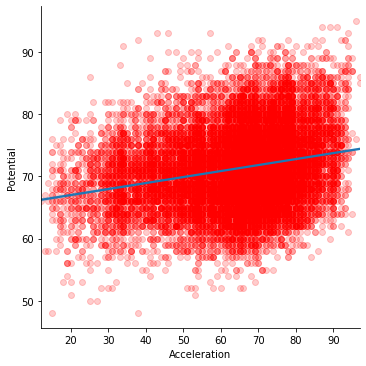

In [23]:
sns.lmplot(data = df, x='Acceleration', y='Potential', scatter_kws={'alpha':0.2, 'color':'r'})

### Potential & Ball Control
The following scatter plot shows the relationship between the target variable ‘Potential’ and ‘Ball Control’ attribute.

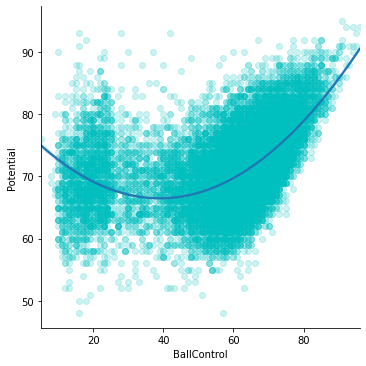

In [24]:
sns.lmplot(data = df, x='BallControl', y='Potential', order =2, scatter_kws={'alpha':0.2, 'color':'c'})

## Potential & Composure Rating relationship  

The following scatter plot shows the relationship between the target variable ‘Potential’ and ‘Overall’ attribute

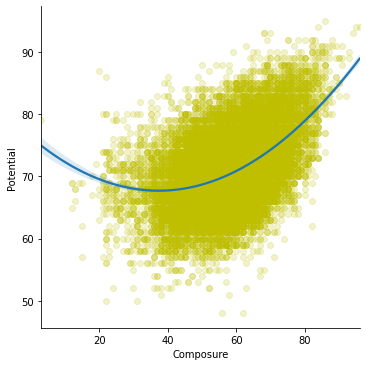

In [25]:
sns.lmplot(data = df, x='Composure', y='Potential', order =2, scatter_kws={'alpha':0.2, 'color':'y'})

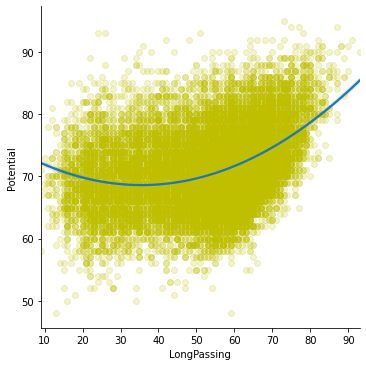

In [26]:
sns.lmplot(data = df, x='LongPassing', y='Potential', order =2, scatter_kws={'alpha':0.2, 'color':'y'})

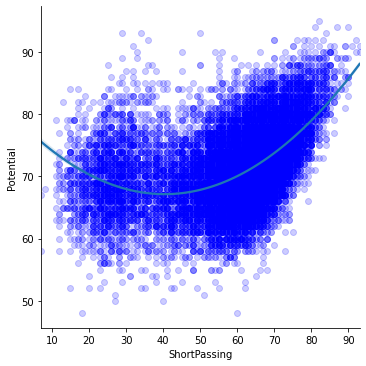

In [27]:
sns.lmplot(data = df, x='ShortPassing', y='Potential', order =2, scatter_kws={'alpha':0.2, 'color':'b'})

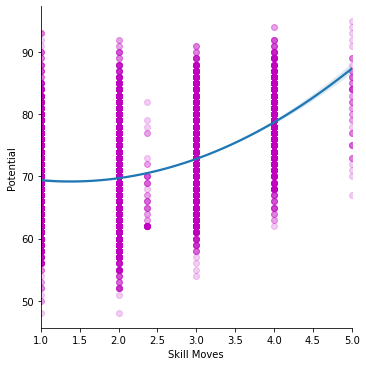

In [28]:
sns.lmplot(data = df, x='Skill Moves', y='Potential', order =2, scatter_kws={'alpha':0.2, 'color':'m'})

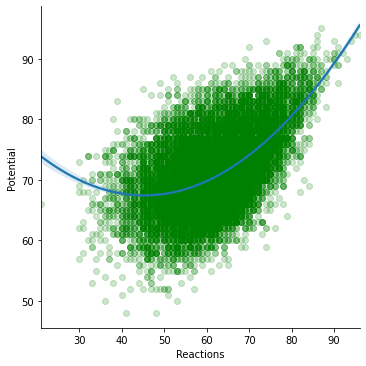

In [29]:
sns.lmplot(data = df, x='Reactions', y='Potential', order =2, scatter_kws={'alpha':0.2, 'color':'g'})

# MODELING
I have used Regression models to predict the potential of a player based on other attributes present in the dataset. I start off using a Basic Linear Regression only using one independent variable. Later, I implement further regression models such as Multiple Regression, Decision Tree Regression, have been used to predict the Potential and their accuracy has been compared.  

 

## Basic Linear Regression Model 
For the Basic Linear Regression model, the attribute ‘BallControl’ has been chosen as the independent variable, and ‘Potential’ as the target variable as defined above. I chose BallControl because it was the highest correlated soccer statistic to potential player score. The following joint plot shows the potential with respect to BallControl.  

In [30]:
#feature for basic model
Xb = df['BallControl']

#target
y = df['Potential']

### Predicting the Overall Rating of a player based on his Ball Control

In [31]:
df.head()

,ID,Name,Age,Potential,International Reputation,Stamina,Strength,Aggression,Composure,BallControl,Dribbling,Acceleration,Agility,Vision,LongPassing,Skill Moves,ShortPassing,ShotPower,Reactions
0,158023,L. Messi,31,94,5.0,72.0,59.0,48.0,96.0,96.0,97.0,91.0,91.0,94.0,87.0,4.0,90.0,85.0,95.0
1,20801,Cristiano Ronaldo,33,94,5.0,88.0,79.0,63.0,95.0,94.0,88.0,89.0,87.0,82.0,77.0,5.0,81.0,95.0,96.0
2,190871,Neymar Jr,26,93,5.0,81.0,49.0,56.0,94.0,95.0,96.0,94.0,96.0,87.0,78.0,5.0,84.0,80.0,94.0
3,193080,De Gea,27,93,4.0,43.0,64.0,38.0,68.0,42.0,18.0,57.0,60.0,68.0,51.0,1.0,50.0,31.0,90.0
4,192985,K. De Bruyne,27,92,4.0,90.0,75.0,76.0,88.0,91.0,86.0,78.0,79.0,94.0,91.0,4.0,92.0,91.0,91.0


### BallControl vs Potential

<Figure size 720x360 with 0 Axes>

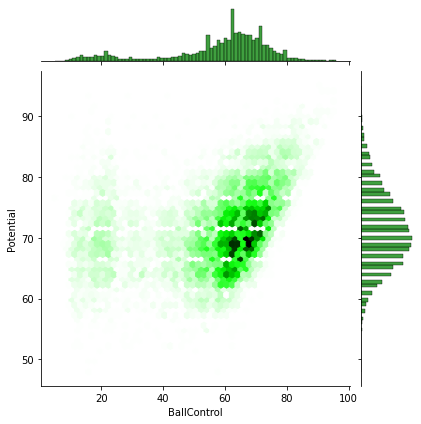

In [32]:
plt.figure(figsize=[10,5])
sns.jointplot(x=df.BallControl,y=df.Potential,kind='hex',color='green')
plt.show()

In [33]:
Xb.head()

0    96.0
1    94.0
2    95.0
3    42.0
4    91.0
Name: BallControl, dtype: float64

In [34]:
y.head()

0    94
1    94
2    93
3    93
4    92
Name: Potential, dtype: int64

In [35]:
#Splitting our data to train
Xb_train, Xb_test, yb_train, yb_test = train_test_split(Xb , y,test_size=0.2, random_state=80)

In [36]:
#Basic Linear Regression Model
lr = LinearRegression()

Xb_train = np.array(Xb_train)
yb_train = np.array(yb_train)

Xb_train = Xb_train.reshape(-1,1)
yb_train = yb_train.reshape(-1,1)

Xb_test = np.array(Xb_test)
Xb_test = Xb_test.reshape(-1,1)

yb_test = np.array(yb_test)
yb_test = yb_test.reshape(-1,1)

lr.fit(Xb_train, yb_train)
y_pred_lr = lr.predict(Xb_test)

print('Training Set Accuracy: {}'.format(lr.score(Xb_train, yb_train)))
print("R-squared score: ", r2_score(yb_test, y_pred_lr))
print("Mean Absolute Error: "  + str(metrics.mean_absolute_error(yb_test, y_pred_lr)))

Training Set Accuracy: 0.12523800798660079
R-squared score:  0.12494625557275152
Mean Absolute Error: 4.606662359259951


## Plotting the training data

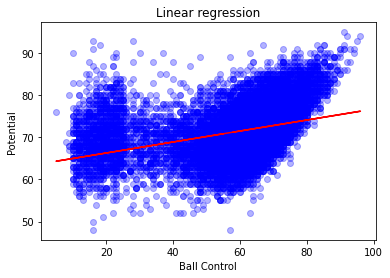

In [37]:
plt.scatter(Xb_train,yb_train,color='blue',alpha=0.3)
plt.xlabel('Ball Control')
plt.ylabel('Potential')
plt.title('Linear regression')
plt.plot(Xb_train,lr.predict(Xb_train),color='red')
plt.show()

## Plotting the test data

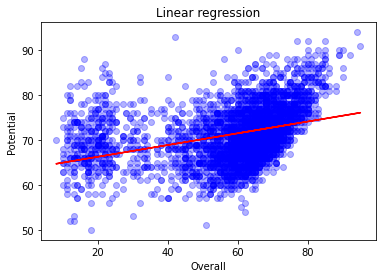

In [38]:
plt.scatter(Xb_test,yb_test,color='blue',alpha=0.3)
plt.xlabel('Overall')
plt.ylabel('Potential')
plt.title('Linear regression')
plt.plot(Xb_test,y_pred_lr,color='red')
plt.show()

In [39]:
print("Intercept: " + str(lr.intercept_))

Intercept: [63.67547254]


In [40]:
print("Coefficient: " + str(lr.coef_))

Coefficient: [[0.13070227]]


Clearly, using just the highest correlated soccer statistic, BallControl, does not give our model great accuracy when it comes to predicting a player’s potential. This makes sense because there are several factors that go into determining Potential.

Let’s add more features to our model and see if there are any improvements to our other models.


##Adding Features

The following attributes have been chosen as the independent variables to find the target variable: 

1. International Rep. 

2. Stamina 

3. Strength 

4. Aggression 

5. Composure 

6. Ball Control 

7. Dribbling 

8. Acceleration 

9. Agility

10. Marking

11. Vision





## Second Round of Modeling

In [41]:
#full features for training
X = df[['International Reputation', 'Stamina','Strength','Aggression',
                'Composure','BallControl', 'Dribbling','Acceleration','Agility','Vision', 'LongPassing', 'Skill Moves', 'ShortPassing', 'ShotPower',
                'Reactions']]

In [42]:
X.head()

,International Reputation,Stamina,Strength,Aggression,Composure,BallControl,Dribbling,Acceleration,Agility,Vision,LongPassing,Skill Moves,ShortPassing,ShotPower,Reactions
0,5.0,72.0,59.0,48.0,96.0,96.0,97.0,91.0,91.0,94.0,87.0,4.0,90.0,85.0,95.0
1,5.0,88.0,79.0,63.0,95.0,94.0,88.0,89.0,87.0,82.0,77.0,5.0,81.0,95.0,96.0
2,5.0,81.0,49.0,56.0,94.0,95.0,96.0,94.0,96.0,87.0,78.0,5.0,84.0,80.0,94.0
3,4.0,43.0,64.0,38.0,68.0,42.0,18.0,57.0,60.0,68.0,51.0,1.0,50.0,31.0,90.0
4,4.0,90.0,75.0,76.0,88.0,91.0,86.0,78.0,79.0,94.0,91.0,4.0,92.0,91.0,91.0


In [43]:
#look for null values
X.isnull().any()

International Reputation    False
Stamina                     False
Strength                    False
Aggression                  False
Composure                   False
BallControl                 False
Dribbling                   False
Acceleration                False
Agility                     False
Vision                      False
LongPassing                 False
Skill Moves                 False
ShortPassing                False
ShotPower                   False
Reactions                   False
dtype: bool

In [44]:
y.head()

0    94
1    94
2    93
3    93
4    92
Name: Potential, dtype: int64

In [45]:
import statsmodels.api as smo
regsum = smo.OLS(endog=y, exog=X).fit()

In [46]:
regsum.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              Potential   R-squared (uncentered):                   0.991
Model:                            OLS   Adj. R-squared (uncentered):              0.991
Method:                 Least Squares   F-statistic:                          1.268e+05
Date:                Fri, 23 Apr 2021   Prob (F-statistic):                        0.00
Time:                        18:12:55   Log-Likelihood:                         -61174.
No. Observations:               18207   AIC:                                  1.224e+05
Df Residuals:                   18192   BIC:                                  1.225e+05
Df Model:                          15                                                  
Covariance Type:            nonrobust                                                  
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
International Reputation     2.4116      0.150     16.057      0.000       2.117       2.706
Stamina                     -0.1024      0.006    -17.564      0.000      -0.114      -0.091
Strength                     0.2785      0.005     57.924      0.000       0.269       0.288
Aggression                  -0.0914      0.005    -19.093      0.000      -0.101      -0.082
Composure                    0.0278      0.008      3.437      0.001       0.012       0.044
BallControl                 -0.0389      0.013     -3.074      0.002      -0.064      -0.014
Dribbling                   -0.1831      0.010    -18.502      0.000      -0.202      -0.164
Acceleration                 0.2935      0.007     44.831      0.000       0.281       0.306
Agility                      0.0929      0.007     13.583      0.000       0.079       0.106
Vision                       0.0487      0.007      7.310      0.000       0.036       0.062
LongPassing                 -0.0244      0.008     -2.991      0.003      -0.040      -0.008
Skill Moves                  1.2453      0.133      9.373      0.000       0.985       1.506
ShortPassing                 0.2360      0.012     19.472      0.000       0.212       0.260
ShotPower                   -0.0747      0.006    -12.928      0.000      -0.086      -0.063
Reactions                    0.5412      0.008     68.151      0.000       0.526       0.557
==============================================================================
Omnibus:                      794.156   Durbin-Watson:                   1.728
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              909.137
Skew:                           0.518   Prob(JB):                    3.83e-198
Kurtosis:                       3.352   Cond. No.                         632.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Adjusted R-Squared(0.991) means that the model explains 99.1 % variables in dependent variable. Lets run our data through some regression models.

#### Multiple Regression Model

In [47]:
#split the data for testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

In [48]:
lr.fit(X_train, y_train)
y_pred_lr2 = lr.predict(X_test)
r2_lr = r2_score(y_test,y_pred_lr2)

print('Training Set Accuracy: {}'.format(lr.score(X_train, y_train)))
print("R-squared score: ",r2_score(y_test, y_pred_lr2))
print("Mean Absolute Error: "  + str(metrics.mean_absolute_error(y_test, y_pred_lr2)))

Training Set Accuracy: 0.3569536633996664
R-squared score:  0.3399158804514758
Mean Absolute Error: 3.950278271677799


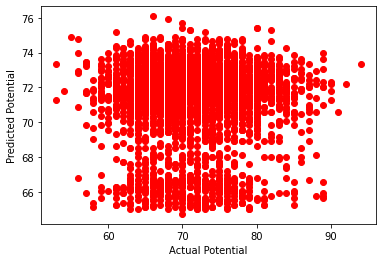

In [49]:
#visualization 
plt.scatter(y_test,y_pred_lr, color='red')
plt.xlabel("Actual Potential")
plt.ylabel("Predicted Potential")
plt.show()

In [50]:
print("Intercept: " + str(lr.intercept_))

Intercept: 48.53562827322631


In [51]:
print("Coefficients: " + str(lr.coef_))

Coefficients: [ 2.49676898 -0.04805385 -0.00773612 -0.03778943  0.04503877  0.04605639
 -0.03847917  0.09439509 -0.07431683 -0.00719328 -0.02270336  1.20858387
  0.11063528 -0.04186283  0.25303366]


#### Decision Tree Regression 

In [52]:
# Training the Decision Tree regression on the training model
from sklearn.tree import DecisionTreeRegressor


regressor_Tree = DecisionTreeRegressor(random_state=0)
regressor_Tree.fit(X_train,y_train)

# Predicting test results
y_pred_t = regressor_Tree.predict(X_test)
r2_t = r2_score(y_test,y_pred_t)

print('Training Set Accuracy: {}'.format(regressor_Tree.score(X_train, y_train)))
print("R-squared score: ",r2_score(y_test, y_pred_t))
print("Mean Absolute Error: "  + str(metrics.mean_absolute_error(y_test, y_pred_t)))

Training Set Accuracy: 0.9978942988518211
R-squared score:  -0.10190983498090689
Mean Absolute Error: 4.907827482786296


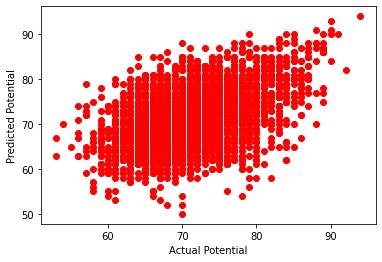

In [53]:
#visualization
plt.scatter(y_test,y_pred_t, color='red')
plt.xlabel("Actual Potential")
plt.ylabel("Predicted Potential")
plt.show()

#### Random Forest Regressor 

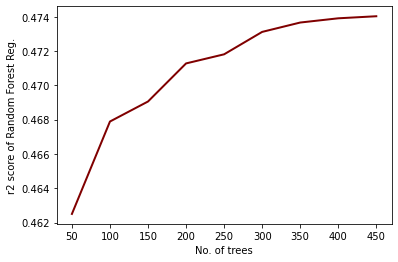

In [54]:
#Find Optimal number of trees

forestRange=range(50,500,50)
scores_list=[]
for i in forestRange: 
    regressor_Forest = RandomForestRegressor(n_estimators=i,random_state=40)
    regressor_Forest.fit(X_train,y_train)
    y_pred = regressor_Forest.predict(X_test)
    scores_list.append(r2_score(y_test,y_pred))
plt.plot(forestRange,scores_list,linewidth=2,color='maroon')
plt.xticks(forestRange)
plt.xlabel('No. of trees')
plt.ylabel('r2 score of Random Forest Reg.')
plt.show()

In [55]:
# Training the Random Forest regression on the training model
regressor_Forest = RandomForestRegressor(n_estimators=450,random_state=40)
regressor_Forest.fit(X_train,y_train)
y_pred_rf = regressor_Forest.predict(X_test)
r2_rf = r2_score(y_test,y_pred_rf)

# Print the metrics
print('Training Set Accuracy: {}'.format(regressor_Forest.score(X_train, y_train)))
print("R-squared score: ",r2_score(y_test, y_pred_rf))
print("Mean Absolute Error: "  + str(metrics.mean_absolute_error(y_test, y_pred_rf)))

Training Set Accuracy: 0.926513318701359
R-squared score:  0.4740246171650845
Mean Absolute Error: 3.4572610449733987


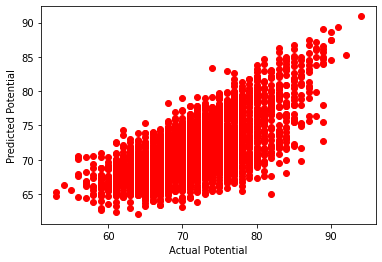

In [56]:
#visualization
plt.scatter(y_test,y_pred, color='red')
plt.xlabel("Actual Potential")
plt.ylabel("Predicted Potential")
plt.show()

#### K-Nearest-Neighbors Regressor

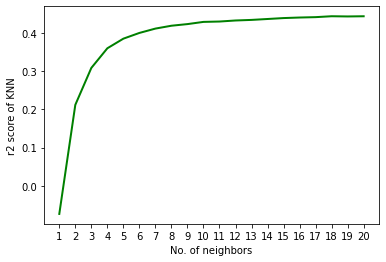

In [57]:
#find optimal number of neighbors to use for the model
knnRange = range(1,21,1)
scores_list = []
for i in knnRange:
    regressor_knn = KNeighborsRegressor(n_neighbors=i)
    regressor_knn.fit(X_train,y_train)
    y_pred = regressor_knn.predict(X_test)
    scores_list.append(r2_score(y_test,y_pred))
plt.plot(knnRange,scores_list,linewidth=2,color='green')
plt.xticks(knnRange)
plt.xlabel('No. of neighbors')
plt.ylabel('r2 score of KNN')
plt.show()

In [58]:
# Training the KNN model on the training set
regressor_knn = KNeighborsRegressor(n_neighbors=8)
regressor_knn.fit(X_train,y_train)
y_pred_knn = regressor_knn.predict(X_test)
r2_knn = r2_score(y_test,y_pred_knn)

print('Training Set Accuracy: {}'.format(regressor_knn.score(X_train, y_train)))
print("R-squared score: ",r2_score(y_test, y_pred_knn))
print("Mean Absolute Error: "  + str(metrics.mean_absolute_error(y_test, y_pred_knn)))

Training Set Accuracy: 0.5458725892152125
R-squared score:  0.41914550734928224
Mean Absolute Error: 3.6298050521691376


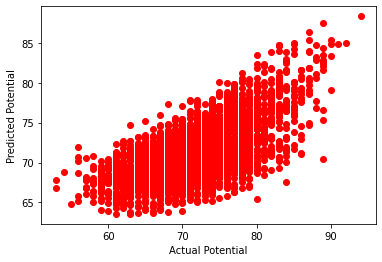

In [59]:
#visualization
plt.scatter(y_test,y_pred, color='red')
plt.xlabel("Actual Potential")
plt.ylabel("Predicted Potential")
plt.show()

#### XGBoost Regressor

In [60]:
regressor_xgb = XGBRegressor()
regressor_xgb.fit(X_train,y_train)

y_pred_xgb = regressor_xgb.predict(X_test)
r2_xgb = r2_score(y_test,y_pred_xgb)

print('Training Set Accuracy: {}'.format(regressor_xgb.score(X_train, y_train)))
print("R-squared score: ", r2_score(y_test, y_pred_xgb))
print("Mean Absolute Error: "  + str(metrics.mean_absolute_error(y_test, y_pred_xgb)))

[18:18:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Training Set Accuracy: 0.4891175856433738
R-squared score:  0.4576709257851318
Mean Absolute Error: 3.537189547535091


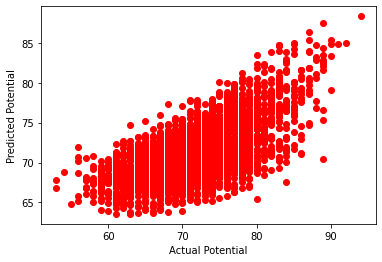

In [61]:
#visualization
plt.scatter(y_test,y_pred, color='red')
plt.xlabel("Actual Potential")
plt.ylabel("Predicted Potential")
plt.show()

We see an improvement in R-Square and MAE score with some of our model regression models. 

The Decision tree regressor model is actually giving us a negative R-Square score, this means that our prediction tends to be less accurate that the average value of the data set over time.

I'm going to select 3 of the models and see if  hyperparameterizing our selected models using GridSearchCV can optimize our results.

## Third Round Modeling using GridSearchCV

#### GridSearchCV on Random Forest Regressor

In [ ]:
#finding best parameters 
param_grid = {'bootstrap': [True],
              'max_depth': [5, 10, None], 
              'max_features': ['auto', 'log2', 'sqrt'], 
              'n_estimators': [400, 500],
              'criterion': ['mae', 'mse', 'entropy']}

g_search = GridSearchCV(estimator = regressor_Forest, param_grid = param_grid, cv = 3, n_jobs = 1, verbose = 0, return_train_score=True)
g_search.fit(X_train, y_train)
print(g_search.best_params_)


KeyboardInterrupt: ignored

In [62]:
rfc1=RandomForestRegressor(random_state=42,
                           max_features='log2', 
                           n_estimators= 500,
                           max_depth = None, 
                           bootstrap = True, 
                           criterion='mse')
rfc1.fit(X_train, y_train)
pred_rf=rfc1.predict(X_test)
r2_rf_g = r2_score(y_test,pred_rf)

print('Training Set Accuracy: {}'.format(rfc1.score(X_train, y_train)))
print("R-squared score: ",r2_score(y_test, pred_rf))
print("Mean Absolute Error: "  + str(metrics.mean_absolute_error(y_test, pred_rf)))

Training Set Accuracy: 0.9270869756662365
R-squared score:  0.48036518344974855
Mean Absolute Error: 3.443018320263961


#### GridSearchCV on Decison Tree Regressor

In [ ]:
#finding best parameters
param_grid = {"criterion": ["mse", "mae"],
              "min_samples_split": [10, 20, 40],
              "max_depth": [2, 6, 8],
              "min_samples_leaf": [100, 200],
              "max_leaf_nodes": [50, 100, 200],
              }

grid_cv_dtm = GridSearchCV(regressor_Tree, param_grid, cv=5)
grid_cv_dtm.fit(X_train,y_train)
print(grid_cv_dtm.best_params_)

In [63]:
dtm = DecisionTreeRegressor(random_state=42, 
                            criterion = 'mse', 
                            max_depth = 8, 
                            max_leaf_nodes = 100, 
                            min_samples_leaf = 100, 
                            min_samples_split = 10)

dtm.fit(X_train, y_train)
pred_dt=dtm.predict(X_test)
r2_dtm_g = r2_score(y_test,pred_dt)

print('Training Set Accuracy: {}'.format(dtm.score(X_train, y_train)))
print("R-squared score: ",r2_score(y_test, pred_dt))
print("Mean Absolute Error: "  + str(metrics.mean_absolute_error(y_test, pred_dt)))

Training Set Accuracy: 0.43611698731584714
R-squared score:  0.39279966768852415
Mean Absolute Error: 3.7532416506401964


#### GridSearchCV on XGBoost Regressor

In [ ]:
#finding best parameters
parameters = {'nthread':[4], #when use hyperthread, xgboost may become slower
              'objective':['reg:linear'],
              'learning_rate': [.03, 0.05, .07], #so called `eta` value
              'max_depth': [5, 6, 7],
              'min_child_weight': [4],
              'silent': [1],
              'subsample': [0.7],
              'colsample_bytree': [0.5 ,0.7],
              'n_estimators': [200,300,400]}

xgb_grid = GridSearchCV(regressor_xgb,
                        parameters,
                        cv = 2,
                        n_jobs = 5,
                        verbose=True)

xgb_grid.fit(X_train, y_train)
print(xgb_grid.best_params_)

In [64]:
xgb = XGBRegressor(random_state=42, 
                          colsample_bytree = 0.7, 
                          learning_rate = 0.05, 
                          max_depth = 5, 
                          min_child_weight = 4, 
                          n_estimators = 200, 
                          nthread = 4, 
                          objective = 'reg:linear', 
                          silent = 1, 
                          subsample = 0.7)

xgb.fit(X_train, y_train)
pred_xgb=dtm.predict(X_test)
r2_xgb_g = r2_score(y_test,pred_xgb)

print('Training Set Accuracy: {}'.format(xgb.score(X_train, y_train)))
print("R-squared score: ",r2_score(y_test, pred_xgb))
print("Mean Absolute Error: "  + str(metrics.mean_absolute_error(y_test, pred_xgb)))

Training Set Accuracy: 0.5597729455120711
R-squared score:  0.39279966768852415
Mean Absolute Error: 3.7532416506401964


## Visualizing MAE and R-Squared Scores

In [65]:
## Comparing the MAE scores of different models before GridSearchCV
labelList1 = ['Multiple Linear Reg.','K-NearestNeighbors','Decision Tree','Random Forest','XGBoost']
mylist1 = [metrics.mean_absolute_error(y_test, y_pred_lr),metrics.mean_absolute_error(y_test, y_pred_knn), 
          metrics.mean_absolute_error(y_test, y_pred_t),metrics.mean_absolute_error(y_test, y_pred_rf), 
          metrics.mean_absolute_error(y_test, y_pred_xgb)]

for i in range(0,len(mylist1)):
    mylist1[i]=np.round(mylist1[i],decimals=2)
print(mylist1)

[5.16, 3.63, 4.91, 3.46, 3.54]


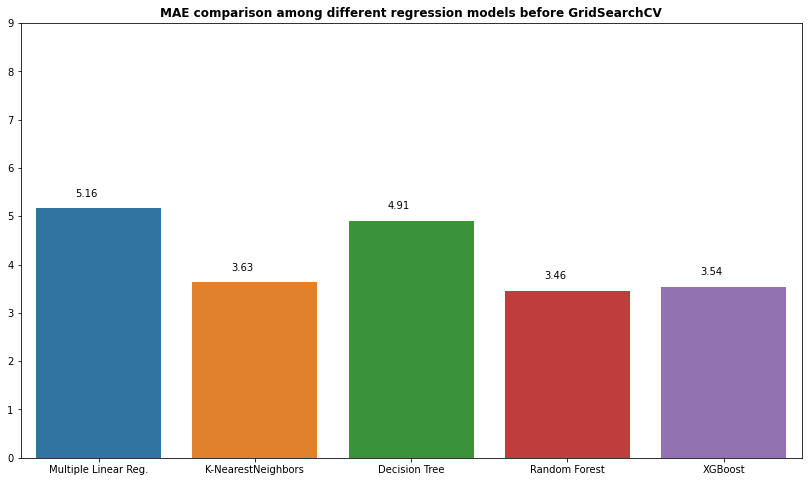

In [66]:
plt.figure(figsize=(14,8))
ax = sns.barplot(x=labelList1,y=mylist1)
plt.yticks(np.arange(0, 10, step=1))
plt.title('MAE comparison among different regression models before GridSearchCV',fontweight='bold')
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.annotate('{:.2f}'.format(height), (x +0.25, y + height + 0.25))
plt.show()

In [67]:
## Comparing the MSE scores of different models after GridSearchCV
labelList3 = ['Decision Tree','Random Forest','XGBoost']
mylist3 = [metrics.mean_absolute_error(y_test, pred_dt),metrics.mean_absolute_error(y_test, pred_rf), 
          metrics.mean_absolute_error(y_test, pred_xgb)]

for i in range(0,len(mylist3)):
    mylist3[i]=np.round(mylist3[i],decimals=2)
print(mylist3)

[3.75, 3.44, 3.75]


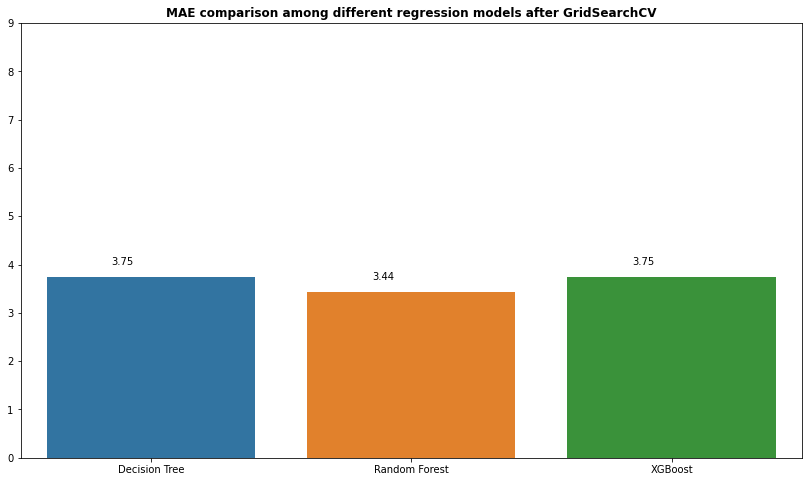

In [68]:
plt.figure(figsize=(14,8))
ax = sns.barplot(x=labelList3,y=mylist3)
plt.yticks(np.arange(0, 10, step=1))
plt.title('MAE comparison among different regression models after GridSearchCV',fontweight='bold')
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.annotate('{:.2f}'.format(height), (x +0.25, y + height + 0.25))
plt.show()

In [69]:
## Comparing the R_Squared scores of different models before doing GridSearchCV
labelList2 = ['Multiple Linear Reg.','K-NearestNeighbors','Decision Tree','Random Forest','XGBoost']
mylist2 = [r2_lr, r2_knn, r2_t,r2_rf,r2_xgb]

for i in range(0,len(mylist2)):
    mylist2[i]=np.round(mylist2[i],decimals=2)
print(mylist2)

[0.34, 0.42, -0.1, 0.47, 0.46]


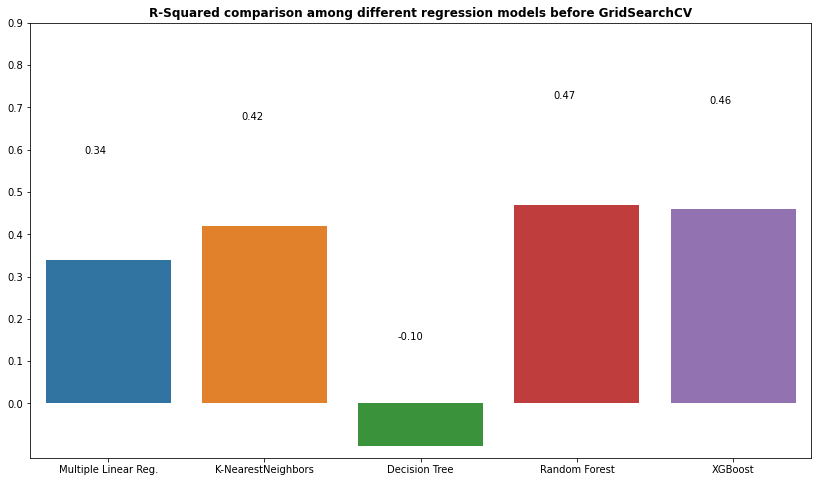

In [70]:
plt.figure(figsize=(14,8))
ax = sns.barplot(x=labelList2,y=mylist2)
plt.yticks(np.arange(0, 1.0 , step=.1))
plt.title('R-Squared comparison among different regression models before GridSearchCV',fontweight='bold')
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.annotate('{:.2f}'.format(height), (x +0.25, y + height + 0.25))
plt.show()

In [71]:
## Comparing the R_Squared scores of different models after doing GridSearchCV
labelList4 = ['Decision Tree','Random Forest','XGBoost']
mylist4 = [r2_dtm_g,r2_rf_g,r2_xgb_g]

for i in range(0,len(mylist4)):
    mylist4[i]=np.round(mylist4[i],decimals=2)
print(mylist4)

[0.39, 0.48, 0.39]


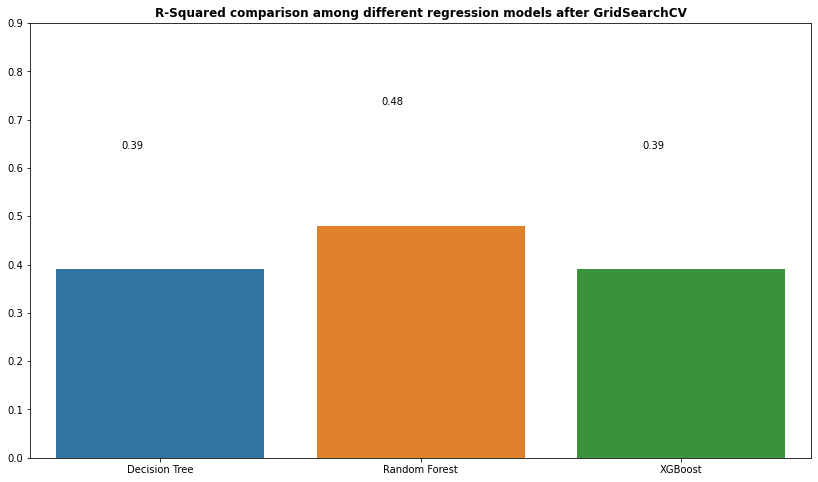

In [72]:
plt.figure(figsize=(14,8))
ax = sns.barplot(x=labelList4,y=mylist4)
plt.yticks(np.arange(0, 1.0 , step=.1))
plt.title('R-Squared comparison among different regression models after GridSearchCV',fontweight='bold')
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.annotate('{:.2f}'.format(height), (x +0.25, y + height + 0.25))
plt.show()

## Finding feature importance

In [73]:
# Get the coefficient of the reqression model
coefs_df = pd.DataFrame()

coefs_df['Features'] = X_train.columns
coefs_df['Coefs'] = regressor_Forest.feature_importances_
coefs_df.sort_values('Coefs', ascending=False).head(10)

,Features,Coefs
5,BallControl,0.318354
14,Reactions,0.129700
7,Acceleration,0.053501
2,Strength,0.053081
1,Stamina,0.051193
13,ShotPower,0.051040
9,Vision,0.050524
12,ShortPassing,0.049990
6,Dribbling,0.048662
3,Aggression,0.048527
